# Documentación de EmotionImageGenerator

Esta documentación desglosa la clase `EmotionImageGenerator` explicando cada uno de sus métodos y su funcionamiento.

## Estructura General

`EmotionImageGenerator` es una clase que genera imágenes artísticas basadas en emociones utilizando el modelo VAD y la API de DALL-E de OpenAI.

## Métodos de la Clase

 `__init__(self, api_key=None)`

**Propósito**: Constructor de la clase que inicializa todas las configuraciones necesarias.

**Parámetros**:
- `api_key` (opcional): Clave de API de OpenAI. Si no se proporciona, intenta obtenerla de las variables de entorno.

**Funcionamiento**:
1. Almacena la clave API proporcionada o busca en la variable de entorno `OPENAI_API_KEY`
2. Inicializa el cliente de OpenAI si la clave API está disponible
3. Define tres diccionarios fundamentales:
   - `emotion_vad_map`: Mapeo entre emociones y sus valores VAD correspondientes
   - `emotion_color_schemes`: Paletas de colores asociadas a cada emoción
   - `emotion_styles`: Estilos artísticos asociados a cada emoción

**Código**:
```python
def __init__(self, api_key=None):
    """
    Initialize the EmotionImageGenerator.
    
    Args:
        api_key (str): OpenAI API key for DALL-E image generation.
                      If None, will look for OPENAI_API_KEY environment variable.
    """
    self.api_key = api_key or os.environ.get("OPENAI_API_KEY")
    if not self.api_key:
        print("Error: No OpenAI API key provided.")
    
    # Initialize OpenAI client
    self.client = OpenAI(api_key=self.api_key) if self.api_key else None
    
    # Emotion to VAD mapping based on the table's 3D model
    self.emotion_vad_map = {
        # From the table, excluding "Other" entries
        "neutral": {"valence": 0, "arousal": 0, "dominance": 0},
        "desire": {"valence": 1, "arousal": 0, "dominance": 0},
        "satisfaction": {"valence": 1, "arousal": 0, "dominance": -1},
        "pessimism": {"valence": -1, "arousal": 0, "dominance": 1},
        "admiration": {"valence": 0, "arousal": 1, "dominance": 0},
        "joy": {"valence": 1, "arousal": 1, "dominance": 0},
        "generosity": {"valence": 1, "arousal": 1, "dominance": 1},
        "love": {"valence": 1, "arousal": 1, "dominance": -1},
        "distressed": {"valence": -1, "arousal": 1, "dominance": 0},
        "anxious": {"valence": -1, "arousal": 1, "dominance": 1},
        "hate": {"valence": -1, "arousal": 1, "dominance": -1},
        "calm": {"valence": 0, "arousal": -1, "dominance": 1},
        "relaxed": {"valence": 1, "arousal": -1, "dominance": 0},
        "overconfident": {"valence": 1, "arousal": -1, "dominance": 1},
        "relief": {"valence": 1, "arousal": -1, "dominance": -1},
        "sadness": {"valence": -1, "arousal": -1, "dominance": 0},
        "rejected": {"valence": -1, "arousal": -1, "dominance": 1}
    }
        
    # Color schemes for different emotions (expanded to include all emotions from the table)
    self.emotion_color_schemes = {
        "neutral": ["gray", "white", "beige"],
        "desire": ["orange", "red", "gold"],
        "satisfaction": ["light green", "yellow", "teal"],
        "pessimism": ["dark blue", "gray", "brown"],
        "admiration": ["purple", "blue", "gold"],
        "joy": ["yellow", "orange", "bright green"],
        "generosity": ["gold", "green", "warm yellow"],
        "love": ["red", "pink", "white"],
        "distressed": ["red", "black", "gray"],
        "anxious": ["orange", "yellow", "red"],
        "hate": ["dark red", "black", "purple"],
        "calm": ["light blue", "teal", "white"],
        "relaxed": ["light blue", "green", "white"],
        "overconfident": ["gold", "bright orange", "yellow"],
        "relief": ["light blue", "white", "pale green"],
        "sadness": ["blue", "gray", "dark blue"],
        "rejected": ["gray", "dark blue", "brown"]
    }
    
    # Artistic styles for different emotions (expanded to include all emotions from the table)
    self.emotion_styles = {
        "neutral": ["minimalist", "contemporary", "abstract"],
        "desire": ["art nouveau", "surrealist", "symbolist"],
        "satisfaction": ["impressionist", "contemporary", "realist"],
        "pessimism": ["dark romanticism", "symbolism", "expressionist"],
        "admiration": ["impressionist", "renaissance", "baroque"],
        "joy": ["pop art", "impressionist", "fauvism"],
        "generosity": ["baroque", "renaissance", "impressionist"],
        "love": ["romantic", "expressionist", "surrealist"],
        "distressed": ["expressionist", "abstract", "cubist"],
        "anxious": ["expressionist", "cubist", "abstract"],
        "hate": ["dark expressionism", "gothic", "abstract expressionism"],
        "calm": ["impressionist", "minimalist", "zen"],
        "relaxed": ["impressionist", "minimalist", "naturalist"],
        "overconfident": ["baroque", "rococo", "pop art"],
        "relief": ["impressionist", "watercolor", "zen"],
        "sadness": ["romanticism", "symbolism", "melancholic"],
        "rejected": ["expressionist", "symbolism", "minimalist"]
    }
```

 `_construct_prompt(self, emotion, valence, arousal, dominance)`

**Propósito**: Método privado que construye un prompt detallado para DALL-E basado en la emoción y los valores VAD.

**Parámetros**:
- `emotion`: La emoción detectada o seleccionada
- `valence`: Valor de valencia (-1 a 1)
- `arousal`: Valor de activación (-1 a 1)
- `dominance`: Valor de dominancia (-1 a 1)

**Funcionamiento**:
1. Normaliza los valores VAD si están fuera del rango -1 a 1
2. Obtiene el esquema de colores y estilos artísticos asociados a la emoción
3. Determina la intensidad emocional basada en el valor de activación
4. Determina la calidad de luz basada en el valor de valencia
5. Determina la composición basada en el valor de dominancia
6. Construye un prompt estructurado que incluye todos estos elementos

**Código**:
```python
def _construct_prompt(self, emotion, valence, arousal, dominance):
    """
    Construct a detailed artistic prompt based on emotion and VAD values.
    
    Args:
        emotion (str): The detected emotion
        valence (float): Valence value (-1 to 1)
        arousal (float): Arousal value (-1 to 1)
        dominance (float): Dominance value (-1 to 1)
        
    Returns:
        str: A detailed prompt for image generation
    """
    # Normalize VAD values if they're in the 1-9 scale
    if valence > 1 or arousal > 1 or dominance > 1:
        valence = self._normalize_vad(valence)
        arousal = self._normalize_vad(arousal)
        dominance = self._normalize_vad(dominance)
    
    # Get color scheme and style for the emotion
    colors = self.emotion_color_schemes.get(emotion.lower(), ["blue", "red", "yellow"])
    styles = self.emotion_styles.get(emotion.lower(), ["abstract", "expressionist"])
    
    # Intensity based on arousal
    intensity = "intense" if arousal > 0.3 else "subtle" if arousal < -0.3 else "moderate"
    
    # Light quality based on valence
    light = "bright" if valence > 0.3 else "dark" if valence < -0.3 else "balanced"
    
    # Composition based on dominance
    composition = "expansive" if dominance > 0.3 else "enclosed" if dominance < -0.3 else "balanced"

    prompt = f"Create an artistic {styles[0]} painting expressing the emotion of {emotion}. "
    prompt += f"Use a palette dominated by {colors[0]} and {colors[1]}, with {light} lighting. "
    prompt += f"The composition should be {composition} with {intensity} emotional expression. "
    prompt += f"The artwork should evoke feelings of {emotion} in an abstract yet recognizable way. "
    prompt += f"Create in the style of {styles[1]} art."
    
    return prompt
```

 `_normalize_vad(self, value, old_min=1, old_max=9, new_min=-1, new_max=1)`

**Propósito**: Método privado que normaliza valores VAD desde una escala (como 1-9) a la escala estándar de -1 a 1.

**Parámetros**:
- `value`: El valor VAD a normalizar
- `old_min`: Mínimo de la escala original (predeterminado: 1)
- `old_max`: Máximo de la escala original (predeterminado: 9)
- `new_min`: Mínimo de la nueva escala (predeterminado: -1)
- `new_max`: Máximo de la nueva escala (predeterminado: 1)

**Funcionamiento**:
1. Aplica una transformación lineal para convertir el valor de la escala original a la nueva escala
2. La fórmula estándar es: `nuevo_valor = ((valor - min_viejo) / (max_viejo - min_viejo)) * (max_nuevo - min_nuevo) + min_nuevo`

**Código**:
```python
def _normalize_vad(self, value, old_min=1, old_max=9, new_min=-1, new_max=1):
    """
    Normalize VAD values from the paper's 1-9 scale to -1 to 1 scale.
    
    Args:
        value (float): The VAD value to normalize
        old_min (float): Original scale minimum
        old_max (float): Original scale maximum
        new_min (float): New scale minimum
        new_max (float): New scale maximum
        
    Returns:
        float: Normalized value
    """
    return ((value - old_min) / (old_max - old_min)) * (new_max - new_min) + new_min
```

 `generate_image(self, emotion, valence=None, arousal=None, dominance=None, size="256x256", output_path=None)`

**Propósito**: Método principal que genera una imagen artística basada en una emoción y valores VAD opcionales.

**Parámetros**:
- `emotion`: La emoción a representar
- `valence` (opcional): Valor de valencia personalizado
- `arousal` (opcional): Valor de activación personalizado
- `dominance` (opcional): Valor de dominancia personalizado
- `size` (opcional): Tamaño de la imagen ("256x256" por defecto)
- `output_path` (opcional): Ruta donde guardar la imagen

**Funcionamiento**:
1. Verifica que la clave API esté configurada
2. Si no se proporcionan valores VAD personalizados, utiliza los valores predeterminados para la emoción
3. Construye el prompt llamando a `_construct_prompt()`
4. Llama a la API de OpenAI para generar la imagen
5. Procesa la respuesta y guarda la imagen si se especificó una ruta
6. Devuelve la imagen generada como objeto de PIL

**Código**:
```python
def generate_image(self, emotion, valence=None, arousal=None, dominance=None, size="256x256", output_path=None):
    """
    Generate an artistic image based on emotion and VAD values using OpenAI's DALL-E.
    Compatible with OpenAI Python library v1.0.0 and later.
    
    Args:
        emotion (str): The detected emotion
        valence (float, optional): Valence value. If None, uses default for emotion.
        arousal (float, optional): Arousal value. If None, uses default for emotion.
        dominance (float, optional): Dominance value. If None, uses default for emotion.
        size (str, optional): Image size. Defaults to "256x256".
        output_path (str, optional): Path to save the image. If None, displays but doesn't save.
        
    Returns:
        PIL.Image.Image: The generated image
    """
    if not self.api_key or not self.client:
        raise ValueError("OpenAI API key not set. Please set OPENAI_API_KEY environment variable or pass to constructor.")
    
    if emotion.lower() in self.emotion_vad_map and (valence is None or arousal is None or dominance is None):
        default_vad = self.emotion_vad_map[emotion.lower()]
        valence = valence if valence is not None else default_vad["valence"]
        arousal = arousal if arousal is not None else default_vad["arousal"]
        dominance = dominance if dominance is not None else default_vad["dominance"]

    prompt = self._construct_prompt(emotion, valence, arousal, dominance)
    
    print(f"Generating image with DALL-E using prompt: {prompt}")
    
    try:
        response = self.client.images.generate(
            prompt=prompt,
            n=1,
            size=size
        )

        image_url = response.data[0].url

        image_response = requests.get(image_url)
        image = Image.open(BytesIO(image_response.content))
        
        if output_path:
            image.save(output_path)
            print(f"Image saved to {output_path}")
        
        return image
        
    except Exception as e:
        print(f"Error generating image with DALL-E: {str(e)}")
        return None
```

 `visualize_emotion_vad_space(self, save_path=None)`

**Propósito**: Crea una visualización 3D del espacio emocional VAD mostrando todas las emociones mapeadas.

**Parámetros**:
- `save_path` (opcional): Ruta donde guardar la visualización

**Funcionamiento**:
1. Crea una figura 3D utilizando matplotlib
2. Extrae los valores VAD para todas las emociones definidas
3. Genera un gráfico de dispersión 3D donde cada punto representa una emoción
4. Añade etiquetas para cada punto con el nombre de la emoción
5. Configura los ejes y límites del gráfico
6. Guarda la visualización si se especificó una ruta
7. Muestra la visualización

**Código**:
```python
def visualize_emotion_vad_space(self, save_path=None):
    """
    Visualize the emotions in the 3D VAD space.
    
    Args:
        save_path (str, optional): Path to save the visualization. If None, displays but doesn't save.
    """
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Prepare data points
    emotions = list(self.emotion_vad_map.keys())
    xs = [self.emotion_vad_map[e]['valence'] for e in emotions]
    ys = [self.emotion_vad_map[e]['arousal'] for e in emotions]
    zs = [self.emotion_vad_map[e]['dominance'] for e in emotions]
    
    # Create scatter plot
    scatter = ax.scatter(xs, ys, zs, c=range(len(emotions)), cmap='hsv', s=100)
    
    # Add labels for each point
    for i, emotion in enumerate(emotions):
        ax.text(xs[i], ys[i], zs[i], emotion, fontsize=9)
    
    # Set labels and title
    ax.set_xlabel('Valence')
    ax.set_ylabel('Arousal')
    ax.set_zlabel('Dominance')
    ax.set_title('Emotions in 3D VAD Space')
    
    # Set axis limits
    ax.set_xlim([-1.2, 1.2])
    ax.set_ylim([-1.2, 1.2])
    ax.set_zlim([-1.2, 1.2])
    
    if save_path:
        plt.savefig(save_path)
        print(f"Visualization saved to {save_path}")
    
    plt.show()
```

 `get_emotion_from_vad(self, valence, arousal, dominance, tolerance=0.3)`

**Propósito**: Identifica la emoción más cercana a unos valores VAD proporcionados.

**Parámetros**:
- `valence`: Valor de valencia (-1 a 1)
- `arousal`: Valor de activación (-1 a 1)
- `dominance`: Valor de dominancia (-1 a 1)
- `tolerance` (opcional): Tolerancia para hacer coincidir. Predeterminado: 0.3

**Funcionamiento**:
1. Inicializa las variables para seguir la mejor coincidencia
2. Para cada emoción en el mapeo VAD:
   - Calcula la distancia euclidiana en el espacio 3D entre los valores proporcionados y los valores de la emoción
   - Actualiza la mejor coincidencia si la distancia es menor que la mínima encontrada hasta ahora
3. Si la distancia mínima es mayor que un umbral calculado, devuelve "unknown" (desconocido)
4. De lo contrario, devuelve el nombre de la emoción más cercana

**Código**:
```python
def get_emotion_from_vad(self, valence, arousal, dominance, tolerance=0.3):
    """
    Get the closest emotion based on VAD values.
    
    Args:
        valence (float): Valence value (-1 to 1)
        arousal (float): Arousal value (-1 to 1)
        dominance (float): Dominance value (-1 to 1)
        tolerance (float, optional): Tolerance for matching. Defaults to 0.3.
        
    Returns:
        str: The closest emotion name
    """
    best_match = None
    min_distance = float('inf')
    
    for emotion, vad in self.emotion_vad_map.items():
        # Calculate Euclidean distance in 3D space
        distance = np.sqrt(
            (valence - vad['valence'])**2 +
            (arousal - vad['arousal'])**2 +
            (dominance - vad['dominance'])**2
        )
        
        if distance < min_distance:
            min_distance = distance
            best_match = emotion
    
    # If no good match, return "unknown"
    if min_distance > tolerance * np.sqrt(3):  # Scaled by max possible distance
        return "unknown"
        
    return best_match
```

## Flujo de trabajo completo

1. **Inicialización**: Se crea una instancia de `EmotionImageGenerator` con una clave API válida
2. **Generación de imágenes**:
   - Se selecciona una emoción y opcionalmente valores VAD personalizados
   - El método `generate_image()` obtiene valores VAD predeterminados si no se proporcionan
   - Se construye un prompt detallado utilizando `_construct_prompt()`
   - Se llama a la API de OpenAI para generar la imagen
   - La imagen se devuelve y opcionalmente se guarda
3. **Funcionalidades adicionales**:
   - `visualize_emotion_vad_space()` para visualizar el espacio emocional
   - `get_emotion_from_vad()` para identificar emociones a partir de valores VAD

## Ejemplo de uso completo

```python
# Importar la clase
from emotion_image_generator import EmotionImageGenerator

# Crear una instancia con clave API
generator = EmotionImageGenerator(api_key="tu_clave_api_aquí")

# Generar una imagen para "alegría" con valores predeterminados
joy_image = generator.generate_image(
    emotion="joy",
    output_path="joy_default.png"
)

# Generar otra imagen para "alegría" con valores VAD personalizados
joy_custom = generator.generate_image(
    emotion="joy",
    valence=0.8,      # Más positivo
    arousal=0.9,      # Más energético
    dominance=0.5,    # Más control
    size="512x512",   # Tamaño mayor
    output_path="joy_custom.png"
)

# Visualizar el espacio emocional VAD
generator.visualize_emotion_vad_space(save_path="vad_space.png")

# Identificar la emoción más cercana a unos valores VAD
emotion = generator.get_emotion_from_vad(0.7, 0.8, -0.3)
print(f"La emoción más cercana es: {emotion}")
```

In [ ]:
import requests
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import time
from openai import OpenAI  # Updated import for OpenAI v1.0+

class EmotionImageGenerator:
    """
    A class to generate artistic images based on emotions detected from EEG data.
    Uses the VAD (Valence, Arousal, Dominance) model as described in the research paper.
    Uses OpenAI's DALL-E to generate images based on emotion parameters.
    Compatible with OpenAI Python library v1.0.0 and later.
    """
    
    def __init__(self, api_key=None):
        """
        Initialize the EmotionImageGenerator.
        
        Args:
            api_key (str): OpenAI API key for DALL-E image generation.
                          If None, will look for OPENAI_API_KEY environment variable.
        """
        self.api_key = api_key or os.environ.get("OPENAI_API_KEY")
        if not self.api_key:
            print("Error: No OpenAI API key provided.")
        
        # Initialize OpenAI client
        self.client = OpenAI(api_key=self.api_key) if self.api_key else None
        
        # Emotion to VAD mapping based on the table's 3D model
        self.emotion_vad_map = {
            # From the table, excluding "Other" entries
            "neutral": {"valence": 0, "arousal": 0, "dominance": 0},
            "desire": {"valence": 1, "arousal": 0, "dominance": 0},
            "satisfaction": {"valence": 1, "arousal": 0, "dominance": -1},
            "pessimism": {"valence": -1, "arousal": 0, "dominance": 1},
            "admiration": {"valence": 0, "arousal": 1, "dominance": 0},
            "joy": {"valence": 1, "arousal": 1, "dominance": 0},
            "generosity": {"valence": 1, "arousal": 1, "dominance": 1},
            "love": {"valence": 1, "arousal": 1, "dominance": -1},
            "distressed": {"valence": -1, "arousal": 1, "dominance": 0},
            "anxious": {"valence": -1, "arousal": 1, "dominance": 1},
            "hate": {"valence": -1, "arousal": 1, "dominance": -1},
            "calm": {"valence": 0, "arousal": -1, "dominance": 1},
            "relaxed": {"valence": 1, "arousal": -1, "dominance": 0},
            "overconfident": {"valence": 1, "arousal": -1, "dominance": 1},
            "relief": {"valence": 1, "arousal": -1, "dominance": -1},
            "sadness": {"valence": -1, "arousal": -1, "dominance": 0},
            "rejected": {"valence": -1, "arousal": -1, "dominance": 1}
        }
        
        # Color schemes for different emotions (expanded to include all emotions from the table)
        self.emotion_color_schemes = {
            "neutral": ["gray", "white", "beige"],
            "desire": ["orange", "red", "gold"],
            "satisfaction": ["light green", "yellow", "teal"],
            "pessimism": ["dark blue", "gray", "brown"],
            "admiration": ["purple", "blue", "gold"],
            "joy": ["yellow", "orange", "bright green"],
            "generosity": ["gold", "green", "warm yellow"],
            "love": ["red", "pink", "white"],
            "distressed": ["red", "black", "gray"],
            "anxious": ["orange", "yellow", "red"],
            "hate": ["dark red", "black", "purple"],
            "calm": ["light blue", "teal", "white"],
            "relaxed": ["light blue", "green", "white"],
            "overconfident": ["gold", "bright orange", "yellow"],
            "relief": ["light blue", "white", "pale green"],
            "sadness": ["blue", "gray", "dark blue"],
            "rejected": ["gray", "dark blue", "brown"]
        }
        
        # Artistic styles for different emotions (expanded to include all emotions from the table)
        self.emotion_styles = {
            "neutral": ["minimalist", "contemporary", "abstract"],
            "desire": ["art nouveau", "surrealist", "symbolist"],
            "satisfaction": ["impressionist", "contemporary", "realist"],
            "pessimism": ["dark romanticism", "symbolism", "expressionist"],
            "admiration": ["impressionist", "renaissance", "baroque"],
            "joy": ["pop art", "impressionist", "fauvism"],
            "generosity": ["baroque", "renaissance", "impressionist"],
            "love": ["romantic", "expressionist", "surrealist"],
            "distressed": ["expressionist", "abstract", "cubist"],
            "anxious": ["expressionist", "cubist", "abstract"],
            "hate": ["dark expressionism", "gothic", "abstract expressionism"],
            "calm": ["impressionist", "minimalist", "zen"],
            "relaxed": ["impressionist", "minimalist", "naturalist"],
            "overconfident": ["baroque", "rococo", "pop art"],
            "relief": ["impressionist", "watercolor", "zen"],
            "sadness": ["romanticism", "symbolism", "melancholic"],
            "rejected": ["expressionist", "symbolism", "minimalist"]
        }
    
    def _construct_prompt(self, emotion, valence, arousal, dominance):
        """
        Construct a detailed artistic prompt based on emotion and VAD values.
        
        Args:
            emotion (str): The detected emotion
            valence (float): Valence value (-1 to 1)
            arousal (float): Arousal value (-1 to 1)
            dominance (float): Dominance value (-1 to 1)
            
        Returns:
            str: A detailed prompt for image generation
        """
        # Normalize VAD values if they're in the 1-9 scale
        if valence > 1 or arousal > 1 or dominance > 1:
            valence = self._normalize_vad(valence)
            arousal = self._normalize_vad(arousal)
            dominance = self._normalize_vad(dominance)
        
        # Get color scheme and style for the emotion
        colors = self.emotion_color_schemes.get(emotion.lower(), ["blue", "red", "yellow"])
        styles = self.emotion_styles.get(emotion.lower(), ["abstract", "expressionist"])
        
        # Intensity based on arousal
        intensity = "intense" if arousal > 0.3 else "subtle" if arousal < -0.3 else "moderate"
        
        # Light quality based on valence
        light = "bright" if valence > 0.3 else "dark" if valence < -0.3 else "balanced"
        
        # Composition based on dominance
        composition = "expansive" if dominance > 0.3 else "enclosed" if dominance < -0.3 else "balanced"

        prompt = f"Create an artistic {styles[0]} painting expressing the emotion of {emotion}. "
        prompt += f"Use a palette dominated by {colors[0]} and {colors[1]}, with {light} lighting. "
        prompt += f"The composition should be {composition} with {intensity} emotional expression. "
        prompt += f"The artwork should evoke feelings of {emotion} in an abstract yet recognizable way. "
        prompt += f"Create in the style of {styles[1]} art."
        
        return prompt
    
    def _normalize_vad(self, value, old_min=1, old_max=9, new_min=-1, new_max=1):
        """
        Normalize VAD values from the paper's 1-9 scale to -1 to 1 scale.
        
        Args:
            value (float): The VAD value to normalize
            old_min (float): Original scale minimum
            old_max (float): Original scale maximum
            new_min (float): New scale minimum
            new_max (float): New scale maximum
            
        Returns:
            float: Normalized value
        """
        return ((value - old_min) / (old_max - old_min)) * (new_max - new_min) + new_min
    
    def generate_image(self, emotion, valence=None, arousal=None, dominance=None, size="256x256", output_path=None):
        """
        Generate an artistic image based on emotion and VAD values using OpenAI's DALL-E.
        Compatible with OpenAI Python library v1.0.0 and later.
        
        Args:
            emotion (str): The detected emotion
            valence (float, optional): Valence value. If None, uses default for emotion.
            arousal (float, optional): Arousal value. If None, uses default for emotion.
            dominance (float, optional): Dominance value. If None, uses default for emotion.
            size (str, optional): Image size. Defaults to "256x256".
            output_path (str, optional): Path to save the image. If None, displays but doesn't save.
            
        Returns:
            PIL.Image.Image: The generated image
        """
        if not self.api_key or not self.client:
            raise ValueError("OpenAI API key not set. Please set OPENAI_API_KEY environment variable or pass to constructor.")
        
        if emotion.lower() in self.emotion_vad_map and (valence is None or arousal is None or dominance is None):
            default_vad = self.emotion_vad_map[emotion.lower()]
            valence = valence if valence is not None else default_vad["valence"]
            arousal = arousal if arousal is not None else default_vad["arousal"]
            dominance = dominance if dominance is not None else default_vad["dominance"]

        prompt = self._construct_prompt(emotion, valence, arousal, dominance)
        
        print(f"Generating image with DALL-E using prompt: {prompt}")
        
        try:
            response = self.client.images.generate(
                prompt=prompt,
                n=1,
                size=size
            )

            image_url = response.data[0].url

            image_response = requests.get(image_url)
            image = Image.open(BytesIO(image_response.content))
            
            if output_path:
                image.save(output_path)
                print(f"Image saved to {output_path}")
            
            return image
            
        except Exception as e:
            print(f"Error generating image with DALL-E: {str(e)}")
            return None
    
    def visualize_emotion_vad_space(self, save_path=None):
        """
        Visualize the emotions in the 3D VAD space.
        
        Args:
            save_path (str, optional): Path to save the visualization. If None, displays but doesn't save.
        """
        fig = plt.figure(figsize=(12, 10))
        ax = fig.add_subplot(111, projection='3d')
        
        emotions = list(self.emotion_vad_map.keys())
        xs = [self.emotion_vad_map[e]['valence'] for e in emotions]
        ys = [self.emotion_vad_map[e]['arousal'] for e in emotions]
        zs = [self.emotion_vad_map[e]['dominance'] for e in emotions]

        scatter = ax.scatter(xs, ys, zs, c=range(len(emotions)), cmap='hsv', s=100)
        
        for i, emotion in enumerate(emotions):
            ax.text(xs[i], ys[i], zs[i], emotion, fontsize=9)

        ax.set_xlabel('Valence')
        ax.set_ylabel('Arousal')
        ax.set_zlabel('Dominance')
        ax.set_title('Emotions in 3D VAD Space')

        ax.set_xlim([-1.2, 1.2])
        ax.set_ylim([-1.2, 1.2])
        ax.set_zlim([-1.2, 1.2])
        
        if save_path:
            plt.savefig(save_path)
            print(f"Visualization saved to {save_path}")
        
        plt.show()
        
    def get_emotion_from_vad(self, valence, arousal, dominance, tolerance=0.3):
        """
        Get the closest emotion based on VAD values.
        
        Args:
            valence (float): Valence value (-1 to 1)
            arousal (float): Arousal value (-1 to 1)
            dominance (float): Dominance value (-1 to 1)
            tolerance (float, optional): Tolerance for matching. Defaults to 0.3.
            
        Returns:
            str: The closest emotion name
        """
        best_match = None
        min_distance = float('inf')
        
        for emotion, vad in self.emotion_vad_map.items():
            distance = np.sqrt(
                (valence - vad['valence'])**2 +
                (arousal - vad['arousal'])**2 +
                (dominance - vad['dominance'])**2
            )
            
            if distance < min_distance:
                min_distance = distance
                best_match = emotion

        if min_distance > tolerance * np.sqrt(3):
            return "unknown"
            
        return best_match

In [ ]:
if __name__ == "__main__":
    os.environ["OPENAI_API_KEY"] = " " 
    generator = EmotionImageGenerator()

    emotions = ["overconfident"]
    for emotion in emotions:
        for i in range(1, 4):
            output_path = f"images/{emotion}_example_{i}.png"
            generator.generate_image(
                emotion=emotion,
                output_path=output_path
            )
            time.sleep(15)


Generating image with DALL-E using prompt: Create an artistic baroque painting expressing the emotion of overconfident. Use a palette dominated by gold and bright orange, with bright lighting. The composition should be expansive with subtle emotional expression. The artwork should evoke feelings of overconfident in an abstract yet recognizable way. Create in the style of rococo art.
Image saved to images/overconfident_example_1.png
Generating image with DALL-E using prompt: Create an artistic baroque painting expressing the emotion of overconfident. Use a palette dominated by gold and bright orange, with bright lighting. The composition should be expansive with subtle emotional expression. The artwork should evoke feelings of overconfident in an abstract yet recognizable way. Create in the style of rococo art.
Image saved to images/overconfident_example_2.png
Generating image with DALL-E using prompt: Create an artistic baroque painting expressing the emotion of overconfident. Use a pa

Displaying images for 17 emotions: neutral, desire, satisfaction, pessimism, admiration, joy, generosity, love, distressed, anxious, hate, calm, relaxed, overconfident, relief, sadness, rejected


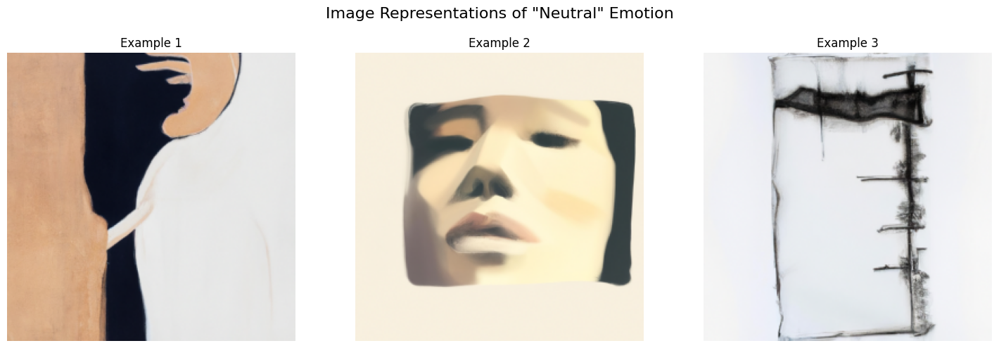

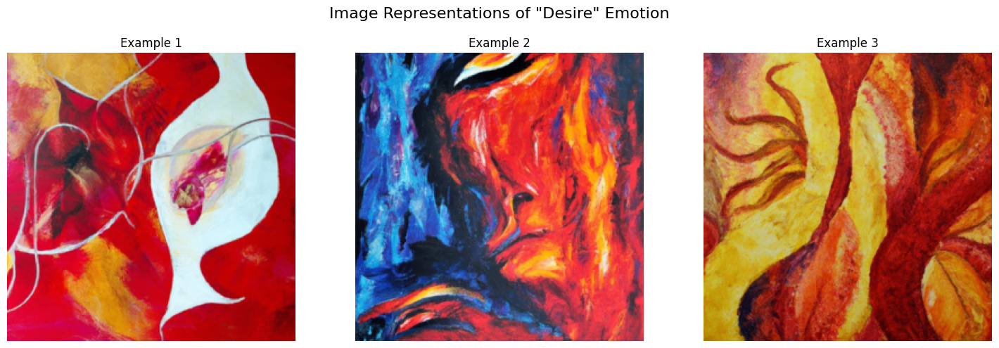

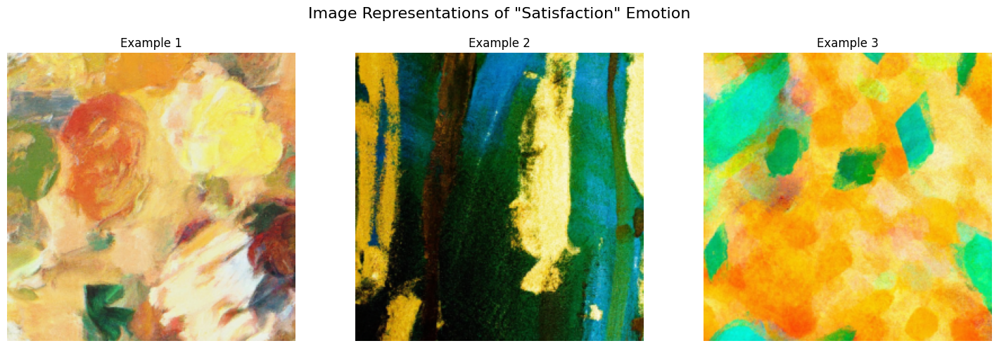

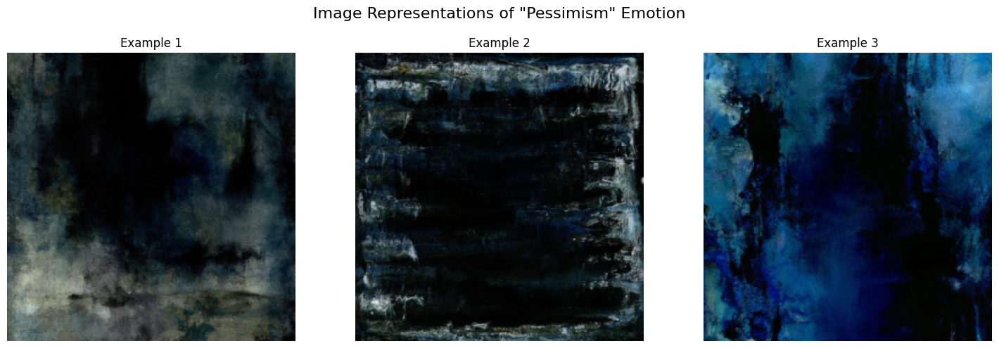

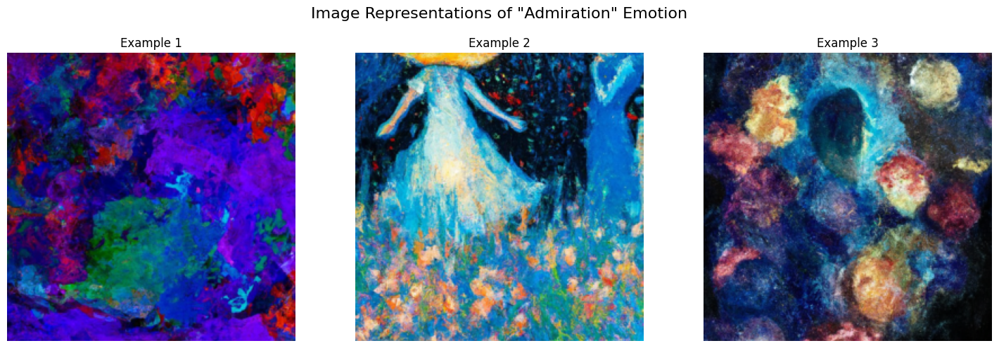

...

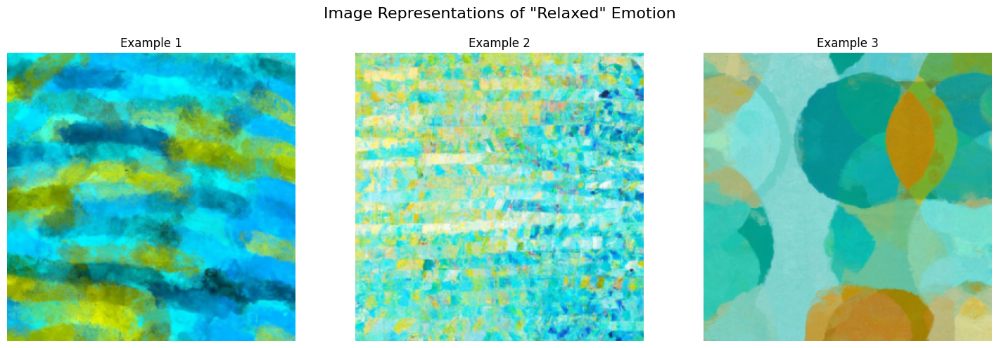

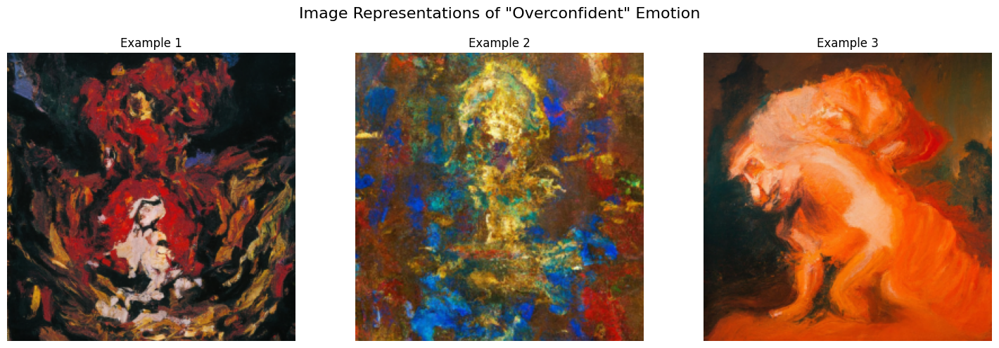

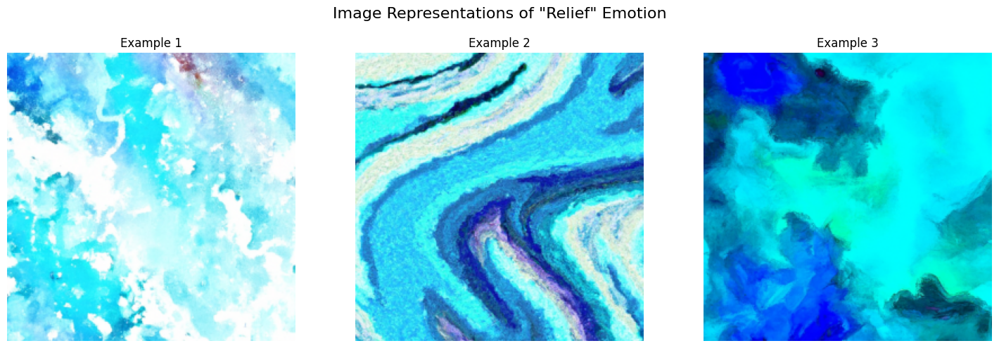

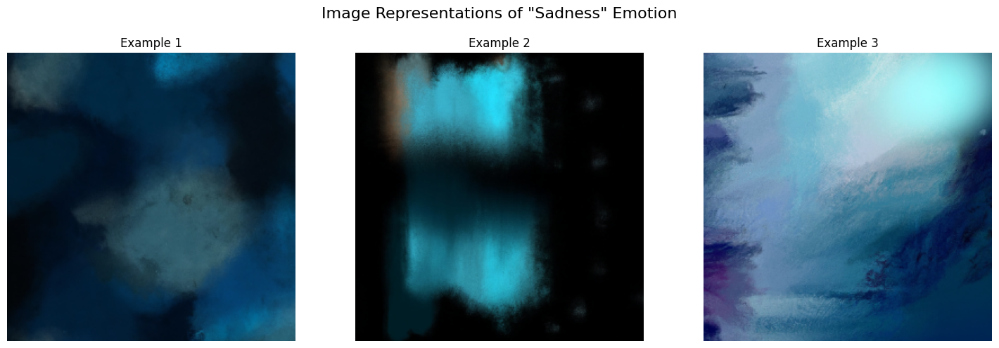

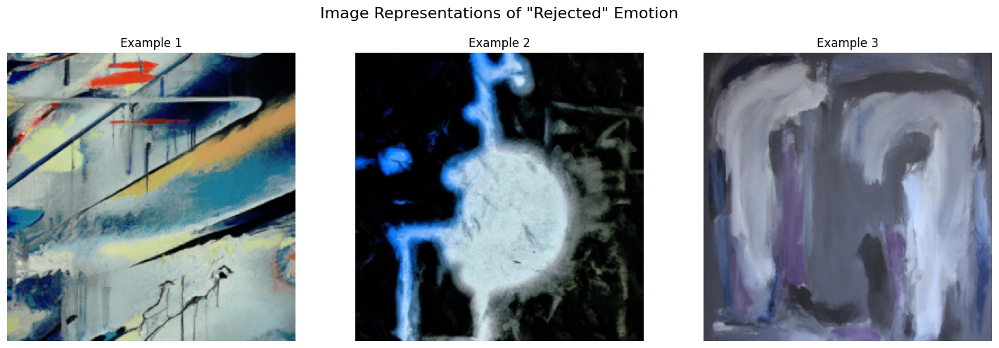

In [6]:
def display_emotion_images(emotions, folder='images/'):
    """
    Display three example images for each emotion in a single row.
    
    Args:
        emotions (list): List of emotions to display images for
        folder (str): Folder path containing the images
    """
    for emotion in emotions:
        # Create a figure with 1 row and 3 columns
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Image Representations of "{emotion.capitalize()}" Emotion', fontsize=16)
        
        # Loop through the three examples
        for i in range(1, 4):
            file_path = os.path.join(folder, f"{emotion}_example_{i}.png")
            
            # Check if file exists
            if os.path.exists(file_path):
                # Read the image
                img = Image.open(file_path)
                
                # Display on the appropriate subplot
                axes[i-1].imshow(img)
                axes[i-1].set_title(f"Example {i}")
                axes[i-1].axis('off')
            else:
                axes[i-1].text(0.5, 0.5, f"Image not found\n{file_path}", 
                              horizontalalignment='center', verticalalignment='center')
                axes[i-1].axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)
        plt.show()

# Get all emotions from the VAD map
emotions_to_display = list(generator.emotion_vad_map.keys())
print(f"Displaying images for {len(emotions_to_display)} emotions: {', '.join(emotions_to_display)}")
display_emotion_images(emotions_to_display)